# Predicting Heart Disease based on Kaggle Provided Dataset
I would like to first state, I am not a medical professional. These results are not conclusive and this project is not meant to act as a scientific basis, it is more about seeing what the data says.

This [dataset is available on Kaggle](https://www.kaggle.com/datasets/utkarshx27/heart-disease-diagnosis-dataset/data). More information on the columns is provided on [UC Irvine's Machine Learning Repository](https://archive.ics.uci.edu/dataset/145/statlog+heart)

While I am no medical expert, my analytical abilities combined with research & consulting with my peers in the health-industry helped me develop this classifier with reasonable subject matter knowledge for experimentation & exploration. My goal is to build a high performing classifier and understand its underlying drivers in hopes of returning some insight to you what correlative factors are the primary drivers of heart disease. While I expect most of the results to be confirmations of what the medical field already knows, I still hope there is some interesting information to gain here!

### IF you download this notebook, click [here to skip to the findings](#Conclusions)
Otherwise you cannot use hyperlinks in notebook internally while viewing on GitHub

## Importing the Data and Preprocessing

In [336]:
import pandas as pd
import numpy as np
import warnings
from sklearn.preprocessing import LabelEncoder

warnings.filterwarnings('ignore')

path = r"dataset_heart.csv"
pd.set_option('display.max_columns', None)

heart_df = pd.read_csv(path, header=0)
print(heart_df.dtypes)
heart_df.head()

age                                       int64
sex                                       int64
chest pain type                           int64
resting blood pressure                    int64
serum cholestoral                         int64
fasting blood sugar                       int64
resting electrocardiographic results      int64
max heart rate                            int64
exercise induced angina                   int64
oldpeak                                 float64
ST segment                                int64
major vessels                             int64
thal                                      int64
heart disease                             int64
dtype: object


,age,sex,chest pain type,resting blood pressure,serum cholestoral,fasting blood sugar,resting electrocardiographic results,max heart rate,exercise induced angina,oldpeak,ST segment,major vessels,thal,heart disease
0,70,1,4,130,322,0,2,109,0,2.4,2,3,3,2
1,67,0,3,115,564,0,2,160,0,1.6,2,0,7,1
2,57,1,2,124,261,0,0,141,0,0.3,1,0,7,2
3,64,1,4,128,263,0,0,105,1,0.2,2,1,7,1
4,74,0,2,120,269,0,2,121,1,0.2,1,1,3,1


#### Columns Explainations
- **`age`**: Age of the patient.

- **`sex`**: Birth-assigned sex of the patient.

- **`chest pain type`**: Type of chest pain experienced, rated on a scale from 1 to 4.

- **`resting blood pressure`**: Resting blood pressure of the patient.
    - Average adult blood pressure is between 80 and 120 mmHg.
    - High blood pressure is a significant risk factor for heart disease.

- **`serum cholesterol`**: Total cholesterol level, including HDL, LDL, and 20% of triglycerides.
    - Measured in milligrams per deciliter (mg/dl).
    - The average adult cholesterol level is between 125-200 mg/dl.

- **`fasting blood sugar`**: Blood sugar level after fasting for 8-12 hours.
    - Ideal levels are below 100 mg/dl, with 100-125 mg/dl considered prediabetic.
    - For reduced heart disease risk, the ideal range is 85-99 mg/dl; levels too low may be associated with strokes.

- **`resting electrocardiographic results`**: Results of the resting ECG, indicating the heart's electrical activity.
    - Normal resting heart rate ranges from 60 to ~100 beats per minute with an even rhythm.

- **`max heart rate`**: Maximum heart rate recorded during strenuous exercise, representing the upper limit of cardiovascular capacity.

- **`exercise induced angina`**: Chest pain triggered by physical exertion.
    - Caused by a lack of oxygen-rich blood reaching the heart, often due to coronary artery blockages.
    - A key symptom of coronary artery disease.

- **`oldpeak`**: ST depression observed during physical activity compared to rest.
    - This can indicate ischemia (reduced blood flow to the heart muscle), which might be a sign of coronary artery disease.

- **`ST segment`**: Slope of the peak exercise ST segment.
    - Changes in the ST segment during exercise can indicate various cardiac conditions, such as heart attacks (elevation) or ischemia (depression).

- **`major vessels`**: Number of major coronary vessels colored by fluroscopy

- **`thal`**: Presence of thalassemia, a group of blood disorders affecting hemoglobin production.
    - Thalassemia leads to anemia early in life and often requires frequent blood transfusions.
    - Excessive iron from transfusions can cause heart complications.

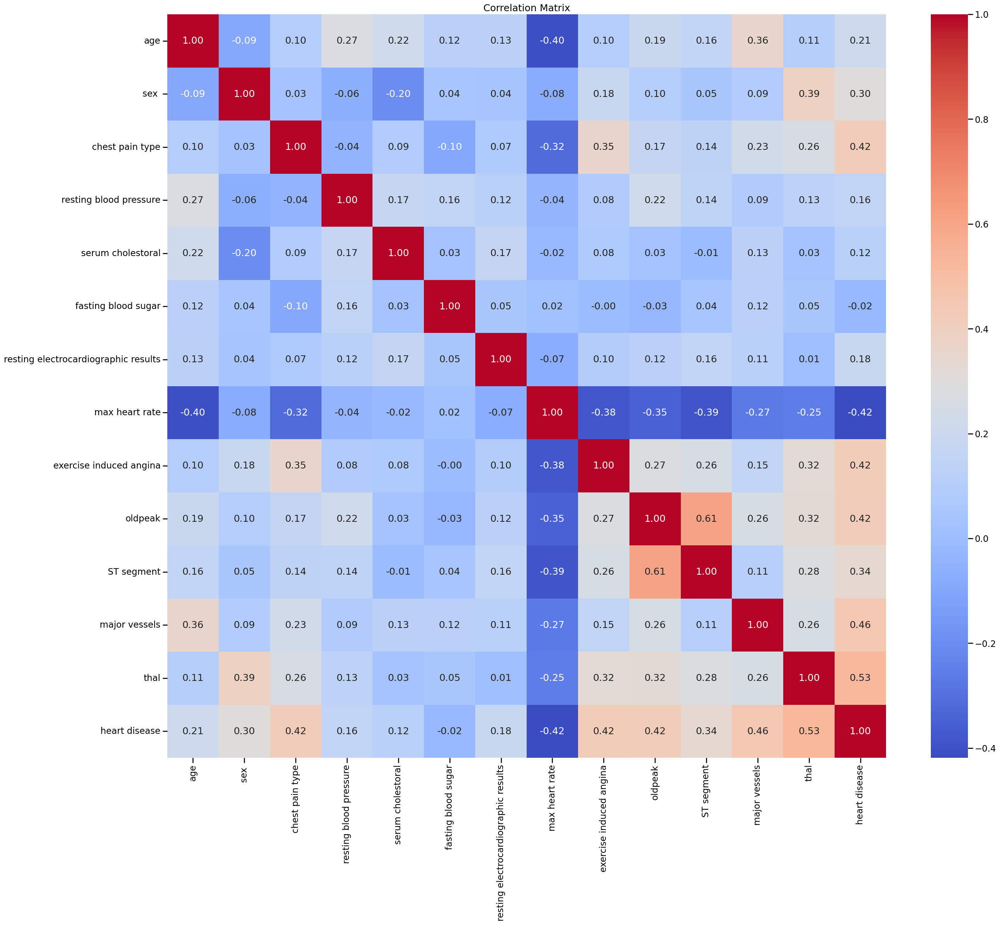

In [337]:
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = heart_df.select_dtypes(include=["number"]).columns
correlation_matrix = heart_df[num_cols].corr()
plt.figure(figsize=(30, 25))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [338]:
# rather would have this labeled with 1s and 0s, more intuitive: 1 = Presence, 0 = Absence
heart_df["heart disease"] = np.where(heart_df["heart disease"] == 2,1,0)

heart_df["heart disease"].value_counts()

heart disease
0    150
1    120
Name: count, dtype: int64

#### Should we stratify the split?
The data has a slight imbalance with Heart Disease diagnosis. This could potentially cause issues with the train-test-split later on.

There is certainly a possibility this imbalance this could be due to random sampling, so this seems to be an appropriate situtation for hypothesis testing to verify a statistically significant difference between the ratio of absent to present heart disease from this dataset.

We will hypothesis test at 99% confidence interval two-tail for z-score to verify whether we should stratify. I choose 99% since the medical field typically likes to work with high confidence intervals and felt this would be appropriate here, especially with only 270 samples.

In [339]:
import scipy.stats as stats

p0 = 0.5
phat = heart_df["heart disease"].mean()

n = len(heart_df["heart disease"])

std_err = np.sqrt((p0*(1-p0))/n)
z = (phat - p0) / std_err

p = 2 * (1 - stats.norm.cdf(abs(z)))

alpha = 0.01

if p < alpha:
    print(f"With a p-value of {p}, we reject the null hypothesis. Stratify the split.")
else:
    print(f"With a p-value of {p}, we do not reject the null hypothesis. Do not stratify the split.")

With a p-value of 0.067889154861829, we do not reject the null hypothesis. Do not stratify the split.


We cannot verify that there is a statistically significant difference between the null hypothesis and the data. Do not stratify the split.

#### Visualize the base data
While this is only 6-Dimensions in a 14 dimension dataset, this is a still good look around of the data!

In [340]:
import plotly
import plotly.graph_objs as go
from sklearn.preprocessing import StandardScaler

markersize = heart_df['max heart rate']/10
markercolor = heart_df['heart disease'].replace(0,"blue").replace(1,"red")
markershape = heart_df['chest pain type'].replace(4,"square").replace(3,'circle').replace(2,'diamond').replace(1,"cross")

plot_df = heart_df.copy()
axis = ['age','resting blood pressure','serum cholestoral']
transform = StandardScaler()
plot_df[axis] = transform.fit_transform(heart_df[axis])

fig1 = go.Scatter3d(x=plot_df['age'],
                    y=plot_df['resting blood pressure'],
                    z=plot_df['serum cholestoral'],
                    marker={
                        'size': markersize,
                        'color': markercolor,
                        'symbol': markershape,
                        'opacity': 0.75,
                        'reversescale': True,
                        'colorscale': 'Blues',
                        'showscale':True,
                        'colorbar':{
                            'title':'Color - Heart Disease',
                            'titleside':'right'
                        }
                    },
                    line={"width":0.02},
                    mode='markers')

mylayout = go.Layout(scene={"xaxis":{"title":"age"},
                            "yaxis":{"title":"resting blood pressure"},
                            "zaxis":{"title":"serum cholestoral"}},
                    )

plotly.offline.plot({"data": [fig1],
                     "layout": mylayout},
                     auto_open=True,
                     filename=(r"6D-Heart-Disease-Plot.html"))

print("Completed")

Completed


### Initial Scatter Plot: No Clustering
Legend:

    Values are standardized
    X: Age of Patient (years)
    Y: Patient's Resting Systollic Blood Pressure
    Z: Serum Cholestoral 
    
    Markercolor: Heart Diease Found: Blue Not Found, Red Found
    Markersize: Max Heart Rate proportional to it divisible by 10
    Marker Shape: Chest Pain Type
        -- 4: Square
        -- 3: Circle
        -- 2: Diamond
        -- 1: Cross
        

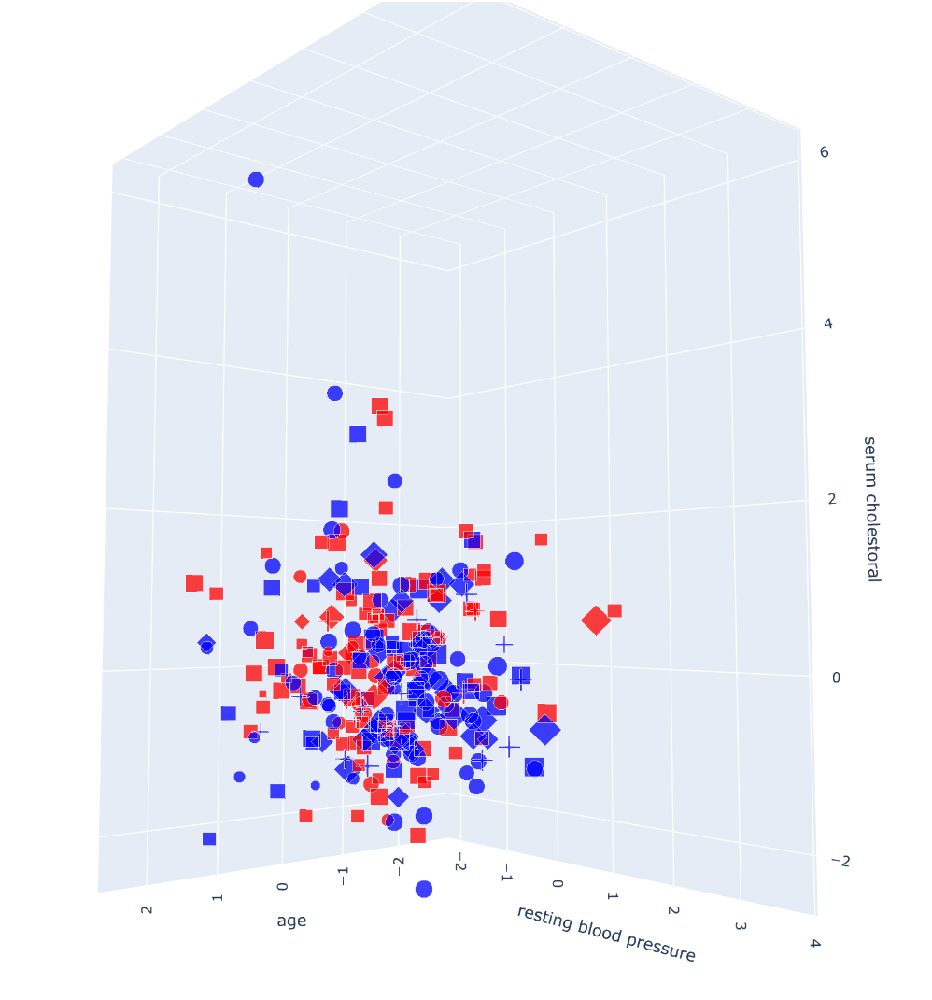

Well looks like I do not need DBSCAN to identify a few outliers!

##### My initial reaction: Overwhelming majority of values in red(found heart disease) are squares(w/Chest Pain Type: 4)
- Albeit, there are blue squares as well!

Let's dig deeper

### Creating Features

In [341]:
heart_df = heart_df.rename(columns={"resting blood pressure":"resting systolic blood pressure"})
### creating age groups
bins15 = [29,45,60,77]
labels15 = ["29-45","46-60","61-77"]
bins10 = [29,40,50,60,77]
labels10 = ["29-40","41-50","51-60","61-77"]
heart_df['~10 year age group'] = pd.cut(heart_df['age'],bins=bins10,labels=labels10,right=True)
heart_df['~15 year age group'] = pd.cut(heart_df['age'],bins=bins15,labels=labels15,right=True)
le = LabelEncoder()
heart_df['~10 year age group encoded'] = le.fit_transform(heart_df['~10 year age group'])
heart_df['~15 year age group encoded'] = le.fit_transform(heart_df['~15 year age group'])


# we are going to use median: typically is a better measure of central tendency, especially with the serum cholestoral displaying a MAJOR outlier
def patientDiffFromMedian(df: pd.DataFrame, groupon: str, median_col: str)-> pd.DataFrame:
    """
    Returns a df w/ the difference of the patients target column value specified in `median_col` and the grouped column specified in `groupon`
    
    Input:
    -- df: dataframe used for the data and receptacle of new columns
    -- groupon: column we will be grouping values on
    -- median_col: column we want to take the central value of based on the grouped column

    Output:
    -- df: This contains one new column
        -- `f'{median_col} difference from {groupon} mean'`: Patient's difference from their target median col value from the grouped median
    """
    grouped = df.groupby(groupon)[median_col].transform('median')
    df[f"{median_col} difference from {groupon} median"] = df[median_col] - grouped
    return df

def patientDiffFromMean(df: pd.DataFrame, groupon: str, median_col: str)-> pd.DataFrame:
    """
    Returns a df w/ the difference of the patients target column value specified in `mean_col` and the grouped column specified in `groupon`

    Median does not work when trying to find binary central tendency metrics since it would return 0 or 1
    
    Input:
    -- df: dataframe used for the data and receptacle of new columns
    -- groupon: column we will be grouping values on
    -- mean_col: column we want to take the central value of based on the grouped column

    Output:
    -- df: This contains one new column
        -- `f'{mean_col} difference from {groupon} mean'`: Patient's difference from their target mean col value from the grouped mean
    """
    grouped = df.groupby(groupon)[median_col].transform('median')
    df[f"{median_col} difference from {groupon} median"] = df[median_col] - grouped
    return df

### chest pain types and systolic blood pressure, max heart rate, and serum cholestoral
heart_df = patientDiffFromMedian(heart_df,groupon="chest pain type",median_col="resting systolic blood pressure")
heart_df = patientDiffFromMedian(heart_df,groupon="chest pain type",median_col="max heart rate")
heart_df = patientDiffFromMedian(heart_df,groupon="chest pain type",median_col="serum cholestoral")

### systolic bp with age
heart_df = patientDiffFromMedian(heart_df,groupon="~10 year age group encoded",median_col="resting systolic blood pressure")
heart_df = patientDiffFromMedian(heart_df,groupon="~15 year age group encoded",median_col="resting systolic blood pressure")

### max heart rate with age
heart_df = patientDiffFromMedian(heart_df,groupon="~10 year age group encoded",median_col="max heart rate")
heart_df = patientDiffFromMedian(heart_df,groupon="~15 year age group encoded",median_col="max heart rate")

### serum cholestoral with age
heart_df = patientDiffFromMedian(heart_df,groupon="~10 year age group encoded",median_col="serum cholestoral")
heart_df = patientDiffFromMedian(heart_df,groupon="~15 year age group encoded",median_col="serum cholestoral")

### major vessels with age
heart_df = patientDiffFromMedian(heart_df,groupon="~10 year age group encoded",median_col="major vessels")
heart_df = patientDiffFromMedian(heart_df,groupon="~15 year age group encoded",median_col="major vessels")

### look at heart rates compared to ecg results
heart_df = patientDiffFromMean(heart_df,"resting electrocardiographic results","max heart rate")

### abnormal ecg with angina
heart_df['angina with abnormalECG'] = ((heart_df['resting electrocardiographic results'] == 2) & (heart_df['exercise induced angina'] == 1)).astype(int)

### both related to ST segments
heart_df['ST segment/oldpeak'] = np.where(heart_df['oldpeak'] != 0,heart_df['ST segment'] / heart_df['oldpeak'], 0)

### let's find out!
def fiddleAroundAndFindOut(columns:list,df:pd.DataFrame)->pd.DataFrame:
    """
    Appropriately, messing around and creating different variable features out of pure experimentation
    Input:
    -- columns: Name of columns *list* we want to interact with each other
    -- df: DataFrame with columns present from `columns`

    Output:
    -- df: DataFrame with specified columns interacting with each other
    """
    for col in columns:
        df[f"log({col})"] = np.log(df[col])
        df[f"sqrt({col})"] = np.sqrt(df[col])
        # df[f"exp({col})"] = np.exp(df[col]) kept causing issues and did not have a lot of importance after analysis, ways to mitigate but removign for now

        for col2 in columns:
            if col2 == col:
                continue
            else:
                df[f"{col}/{col2}"] = df[col]/df[col2]
                df[f"np.log({col})/np.log({col2})"] = np.log(df[col])/np.log(df[col2])
                df[f"{col}*{col2}^2"] = (df[col] * df[col2])**2
                df[f"{col}^2 + {col2}^2"] = df[col]**2 + df[col2]**2
                df[f"{col}^2 + 2*{col}*{col2} + {col2}^2"] = df[col]**2 + 2*df[col]*df[col2] + df[col2]**2
    return df
                
def outside1stAnd3rdQuantile(columns: str, df:pd.DataFrame)-> pd.DataFrame:
    """
    Finding out whether or not a patients value is consider outside IQR
    Input:
    -- columns: Name of columns *list* we want to test the value inside to determine if they are within the IQR
    -- df: DataFrame with columns present from `columns`

    Output:
    -- df: DataFrame with binary quantile feature about specified columns determining whether they live in the IQR of the overall feature
    """
    for col in columns:
        Q1 = heart_df[col].quantile(0.25)
        Q3 = heart_df[col].quantile(0.75)
        df[f"{col} outside quantiles"] = ((df[col] > Q3) | (df[col] < Q1)).astype(int)
    return df
    

heart_df = fiddleAroundAndFindOut(columns=["resting systolic blood pressure",
                                           "serum cholestoral",
                                           "max heart rate"],df=heart_df)
heart_df = outside1stAnd3rdQuantile(columns=["resting systolic blood pressure",
                                             "serum cholestoral",
                                             "max heart rate"], df=heart_df)

### chest pain and angina
chestpain_angina_percentages = heart_df.groupby('chest pain type')['exercise induced angina'].mean().reset_index()
chestpain_angina_percentages = chestpain_angina_percentages.rename(columns={"exercise induced angina": 'CP group likelihood to exper. ex angina'})
heart_df = pd.merge(heart_df, chestpain_angina_percentages, on='chest pain type', how='left')
heart_df['Likely to experience angina'] = (heart_df['CP group likelihood to exper. ex angina'] >= 0.5).astype(int)

#### Justifying feature creations
The majority of these are evaluating their continuous metrics on a group they belong to, age group and chest pain type specifically. These enable us to get a bit more of a granular view of the person's data compared to even more similar people. `max heart rate difference from resting electrocardiographic results mean` enables us to compare people to their respective grouping of resting electrocardiographic results based on max heart rate. `angina with abnormalECG` seemed like a good possible predictor based on research & consulting with my peers. A ratio of `ST Segment/oldpeak` is used to help see how these two features interact since they are related. The `fiddleAroundAndFindOut` generated features are just an exhaustive way to eliminate some other potential data points by transforming the data and creating feature interactions. `outside1stAnd3rdQuantile` gives us an indication whether the person is outside the IQR of the feature, potentially identifying more extreme values. Finally, the last two are just basically built on the idea that chest pain and angina would seem to be correlated so I decided to explore it via looking at both the person's likelihood to experience angina based on their chest pain type AND whether or not their group was likely.

Let's get some numerical summary statistics

In [342]:
heart_df.describe()

,age,sex,chest pain type,resting systolic blood pressure,serum cholestoral,fasting blood sugar,resting electrocardiographic results,max heart rate,exercise induced angina,oldpeak,ST segment,major vessels,thal,heart disease,~10 year age group encoded,~15 year age group encoded,resting systolic blood pressure difference from chest pain type median,max heart rate difference from chest pain type median,serum cholestoral difference from chest pain type median,resting systolic blood pressure difference from ~10 year age group encoded median,resting systolic blood pressure difference from ~15 year age group encoded median,max heart rate difference from ~10 year age group encoded median,max heart rate difference from ~15 year age group encoded median,serum cholestoral difference from ~10 year age group encoded median,serum cholestoral difference from ~15 year age group encoded median,major vessels difference from ~10 year age group encoded median,major vessels difference from ~15 year age group encoded median,max heart rate difference from resting electrocardiographic results median,angina with abnormalECG,ST segment/oldpeak,log(resting systolic blood pressure),sqrt(resting systolic blood pressure),resting systolic blood pressure/serum cholestoral,np.log(resting systolic blood pressure)/np.log(serum cholestoral),resting systolic blood pressure*serum cholestoral^2,resting systolic blood pressure^2 + serum cholestoral^2,resting systolic blood pressure^2 + 2*resting systolic blood pressure*serum cholestoral + serum cholestoral^2,resting systolic blood pressure/max heart rate,np.log(resting systolic blood pressure)/np.log(max heart rate),resting systolic blood pressure*max heart rate^2,resting systolic blood pressure^2 + max heart rate^2,resting systolic blood pressure^2 + 2*resting systolic blood pressure*max heart rate + max heart rate^2,log(serum cholestoral),sqrt(serum cholestoral),serum cholestoral/resting systolic blood pressure,np.log(serum cholestoral)/np.log(resting systolic blood pressure),serum cholestoral*resting systolic blood pressure^2,serum cholestoral^2 + resting systolic blood pressure^2,serum cholestoral^2 + 2*serum cholestoral*resting systolic blood pressure + resting systolic blood pressure^2,serum cholestoral/max heart rate,np.log(serum cholestoral)/np.log(max heart rate),serum cholestoral*max heart rate^2,serum cholestoral^2 + max heart rate^2,serum cholestoral^2 + 2*serum cholestoral*max heart rate + max heart rate^2,log(max heart rate),sqrt(max heart rate),max heart rate/resting systolic blood pressure,np.log(max heart rate)/np.log(resting systolic blood pressure),max heart rate*resting systolic blood pressure^2,max heart rate^2 + resting systolic blood pressure^2,max heart rate^2 + 2*max heart rate*resting systolic blood pressure + resting systolic blood pressure^2,max heart rate/serum cholestoral,np.log(max heart rate)/np.log(serum cholestoral),max heart rate*serum cholestoral^2,max heart rate^2 + serum cholestoral^2,max heart rate^2 + 2*max heart rate*serum cholestoral + serum cholestoral^2,resting systolic blood pressure outside quantiles,serum cholestoral outside quantiles,max heart rate outside quantiles,CP group likelihood to exper. ex angina,Likely to experience angina
count,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.00000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,2.700000e+02,270.000000,270.000000,270.000000,270.000000,2.700000e+02,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,2.700000e+02,270.000000,270.000000,270.000000,270.000000,2.700000e+02,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,2.700000e+02,270.000000,270.000000,270.000000,270.000000,2.700000e+02,270.000000,270.000000,270.0000

#### Correlation Heatmap

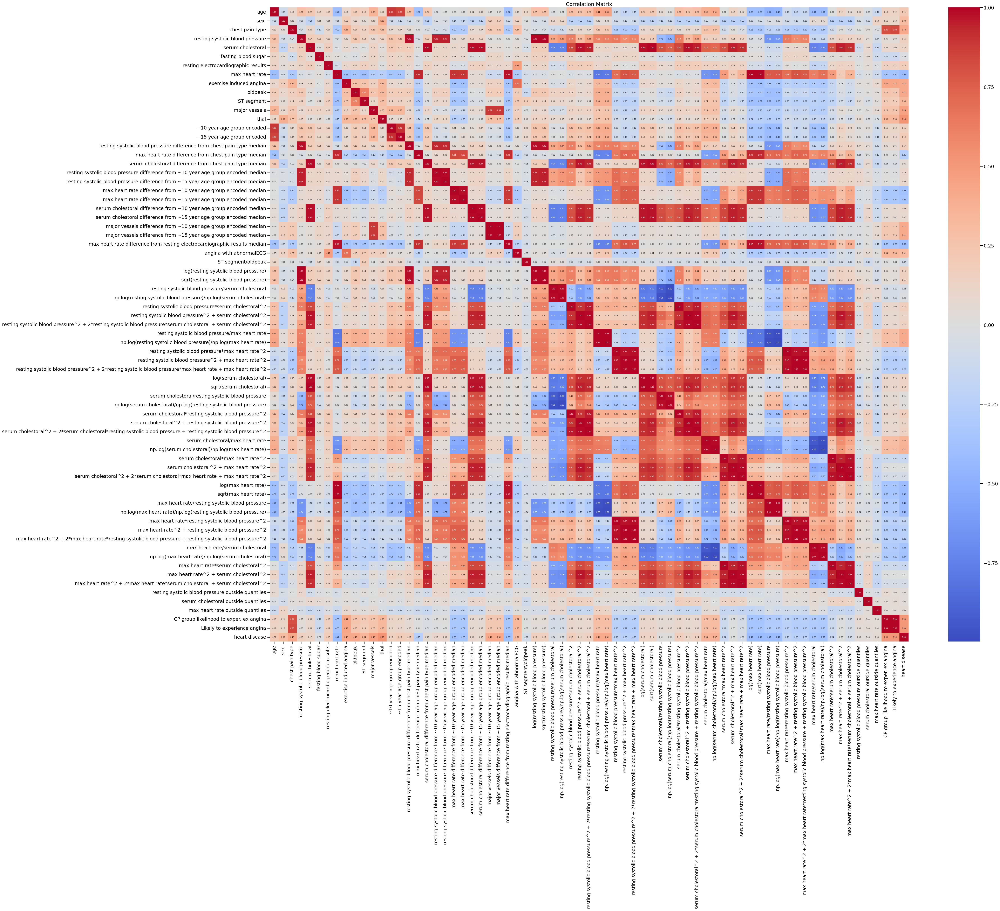

In [343]:
cols = [col for col in heart_df.columns if col != 'heart disease']
cols.append('heart disease')
heart_df = heart_df[cols]
num_cols = heart_df.select_dtypes(include=["number"]).columns
correlation_matrix = heart_df[num_cols].corr()
plt.figure(figsize=(50, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 6})
plt.title('Correlation Matrix')
plt.show()

#### Next let's look at the concentration of values in regions

Error occured on : ~10 year age group
Error occured on : ~15 year age group


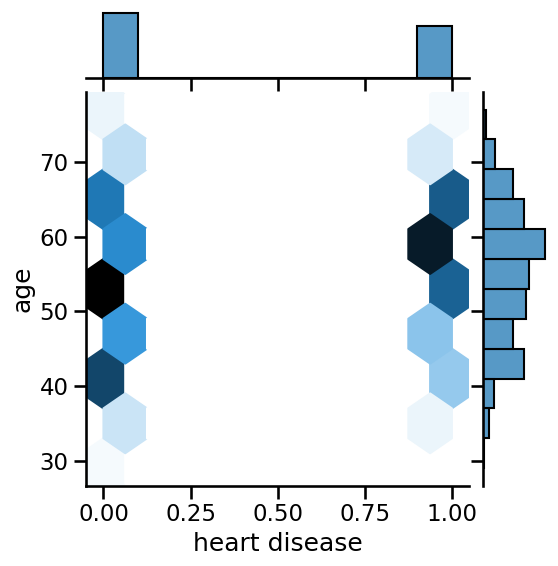

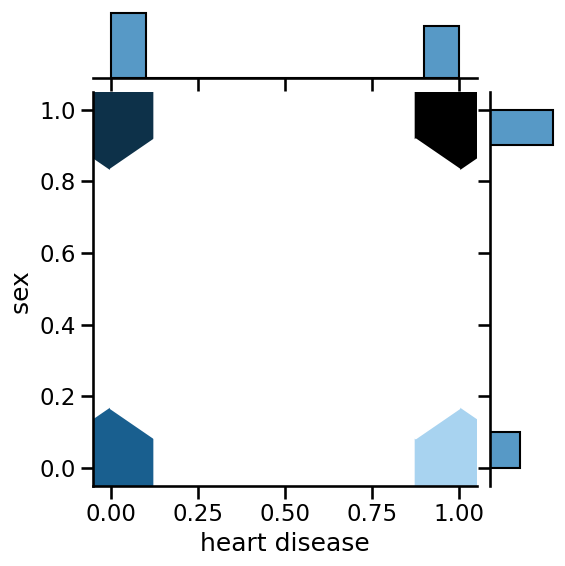

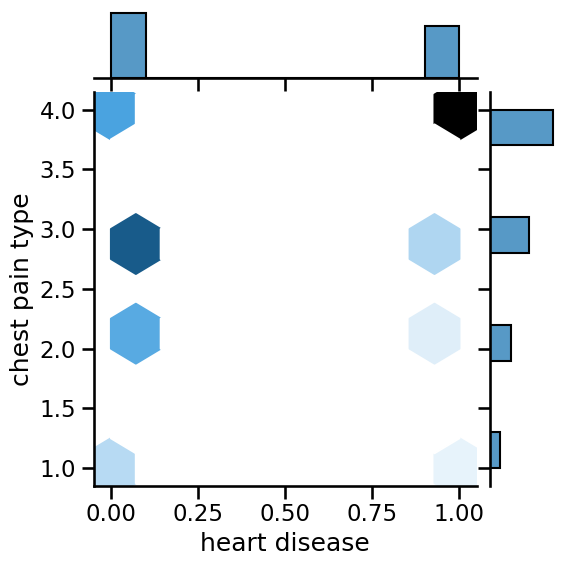

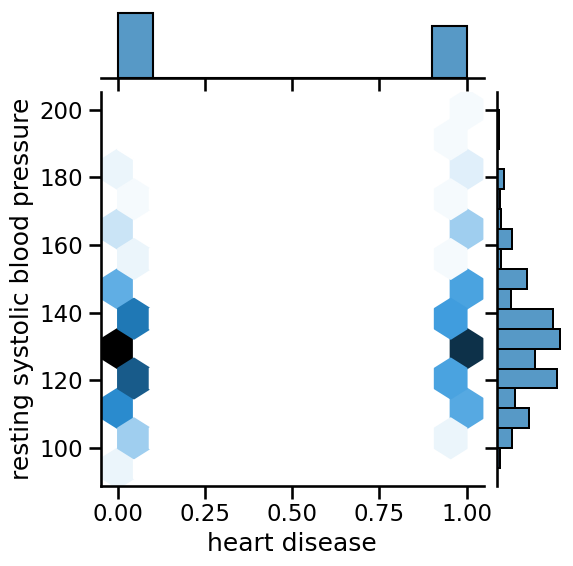

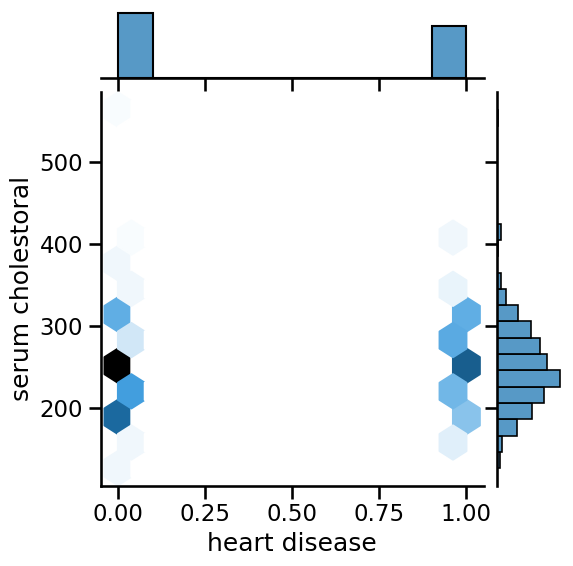

...

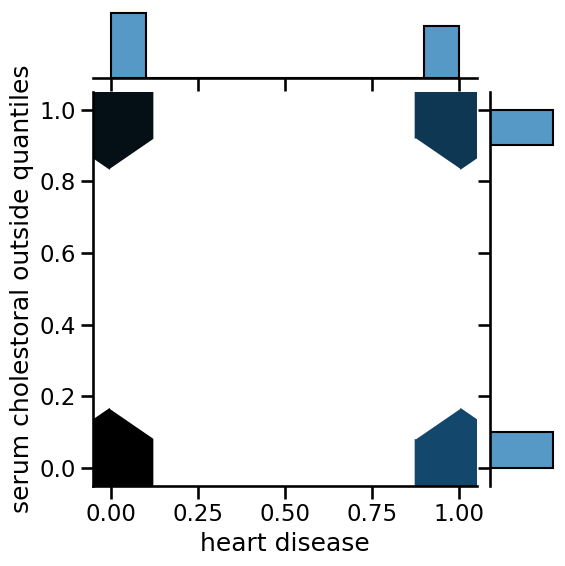

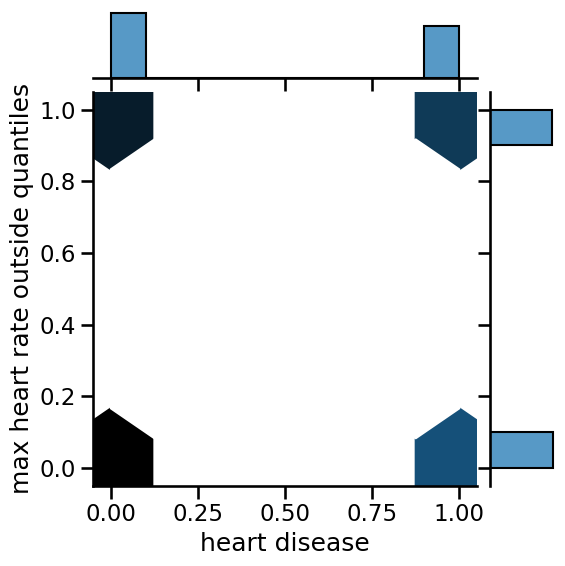

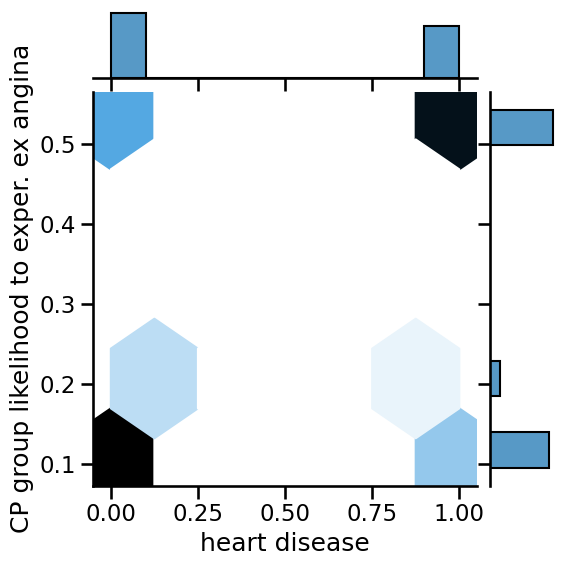

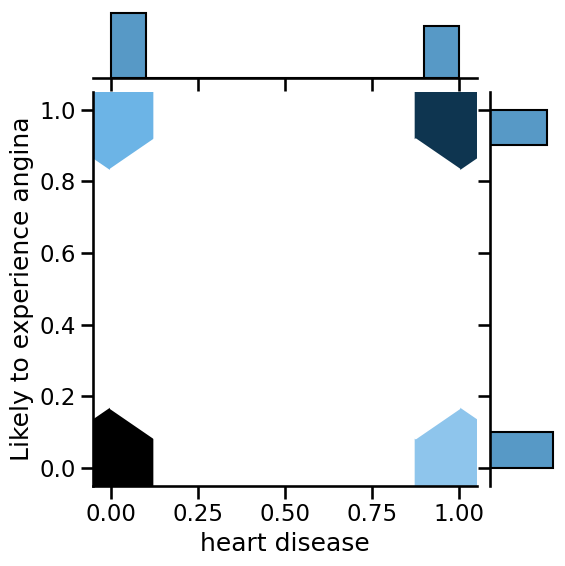

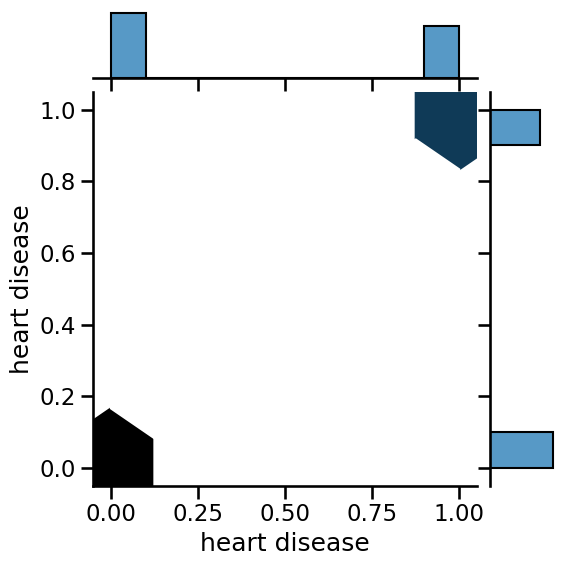

In [344]:
def hexbins(df:pd.DataFrame, targ_col:str) -> sns.axisgrid.JointGrid:
    """
    Creates a hexbin plot for a target column against the columns in dataframe
    
    Inputs:
    -- df: DataFrame
    -- targ_col: String for column which we will be focusing the plot on
    
    Outputs:
    -- Will return hexbin plots for specified `targ_col` against columns in dataframe
    """
    for column in df.columns:
        try:
            sns.jointplot(x=df[targ_col],
                          y=df[column],
                          kind='hex')
        except:
            # for debugging
            print(f"Error occured on : {column}")

hexbins(heart_df, "heart disease")

***Why use the hexbins over a scatterplot?*** Both have their uses so I am not advocating all the time. Here I felt it would give me a better idea how each indiviudal statistic is being distributed in terms of density than a traditional scatterplot or `sns.pairplot` method, especially since I am comparing to a binary variable where it is harder to differentiate distinct points.

## Classification Methods
#### EDA

##### Feature Evaluation with LASSO & Ridge
Before we perform our classification model, we should look at the most important features.

First we will look at the LASSO regression effect on the data

In [351]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

num_cols = [col for col in heart_df.select_dtypes(include=['number']).columns if col != 'heart disease']

X = heart_df.iloc[:,:-1]
Y = heart_df.iloc[:,-1]

transform = StandardScaler()
X = transform.fit_transform(X[num_cols])

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.15,random_state=42)

lasso = LogisticRegression(random_state=42)
param_grid = {
    "C":[0.1,1,10,20],
    "penalty":['l1'],
    "solver":['liblinear']
}

lasso_CV = GridSearchCV(lasso,param_grid, cv=10)
lasso_CV.fit(X_train,y_train)

best_lasso = lasso_CV.best_estimator_
coefs = pd.Series(best_lasso.coef_[0], index=num_cols)
lasso_features = coefs[coefs != 0].sort_values(ascending=False)
# do not want to alls use max rows, but we need it here
with pd.option_context('display.max_rows', None):
    print(lasso_features)

Likely to experience angina                                        0.561635
thal                                                               0.492322
oldpeak                                                            0.403767
major vessels                                                      0.372196
resting systolic blood pressure/max heart rate                     0.197269
exercise induced angina                                            0.163257
sex                                                                0.135599
np.log(serum cholestoral)/np.log(max heart rate)                   0.099676
ST segment                                                         0.087748
major vessels difference from ~10 year age group encoded median    0.025043
major vessels difference from ~15 year age group encoded median    0.011024
dtype: float64


Next, let's look at Ridge to check for multicollinearity

In [346]:
ridge = LogisticRegression(random_state=42)
param_grid = {
    "C":[0.1,1,10,20],
    "penalty":['l2'],
    "solver":['liblinear','lbfgs']
}

ridge_CV = GridSearchCV(ridge,param_grid, cv=10)
ridge_CV.fit(X_train,y_train)

best_ridge = ridge_CV.best_estimator_
coefs = pd.Series(best_ridge.coef_[0], index=num_cols)
ridge_features = coefs[coefs != 0].sort_values(ascending=False)
# do not want to alls use max rows, but we need it here
with pd.option_context('display.max_rows', None):
    print(ridge_features)

thal                                                                                                             0.472458
sex                                                                                                              0.456521
oldpeak                                                                                                          0.379990
ST segment                                                                                                       0.323846
Likely to experience angina                                                                                      0.290711
major vessels                                                                                                    0.278612
CP group likelihood to exper. ex angina                                                                          0.276550
exercise induced angina                                                                                          0.224492
major vessels difference

##### **Feature Permutations**
##### LASSO

(70, 5)


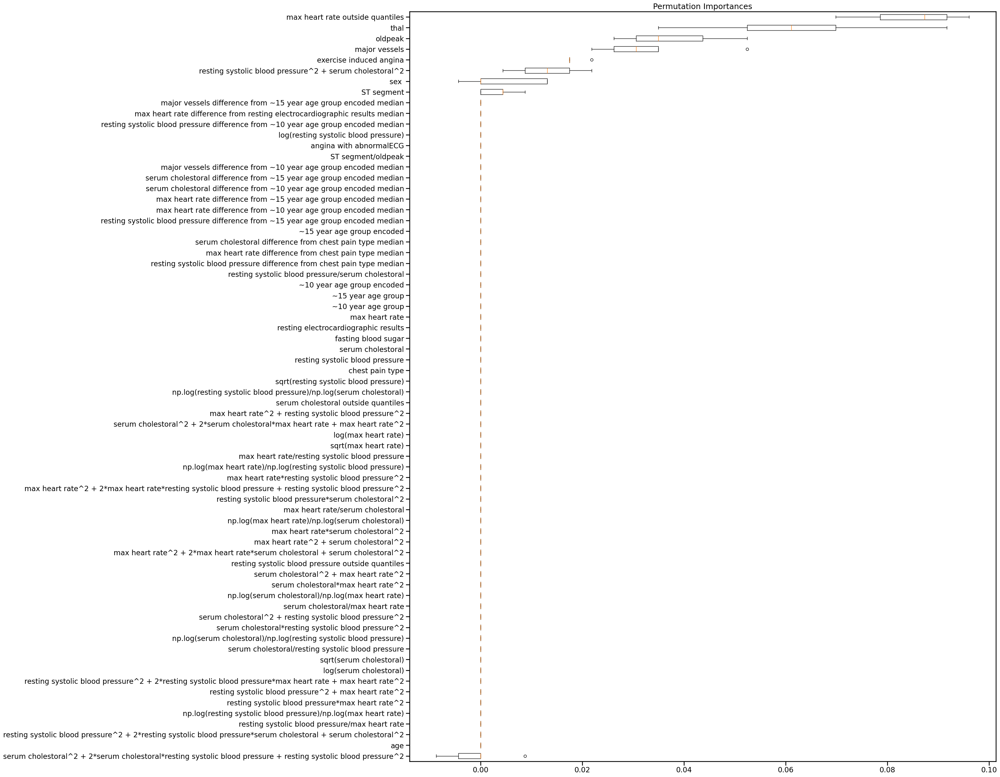

In [353]:
from sklearn.inspection import permutation_importance

def visualize_feature_importance(importance_array):
    # Sort the array based on mean value
    sorted_idx = importance_array.importances_mean.argsort()
    # Visualize the feature importances using boxplot
    fig, ax = plt.subplots()
    fig.set_figwidth(20)
    fig.set_figheight(25)
    fig.tight_layout()
    ax.boxplot(importance_array.importances[sorted_idx].T,
               vert=False, labels=heart_df.iloc[:,:-1].columns[sorted_idx])
    ax.set_title("Permutation Importances")
    plt.show()

# lasso
feature_importances = permutation_importance(estimator=lasso_CV.best_estimator_,
                                             X = X_train,
                                             y = y_train,
                                             n_repeats=5,
                                             random_state=123, 
                                             n_jobs=2)
print(feature_importances.importances.shape)
feature_importances.importances

visualize_feature_importance(feature_importances)

(70, 5)


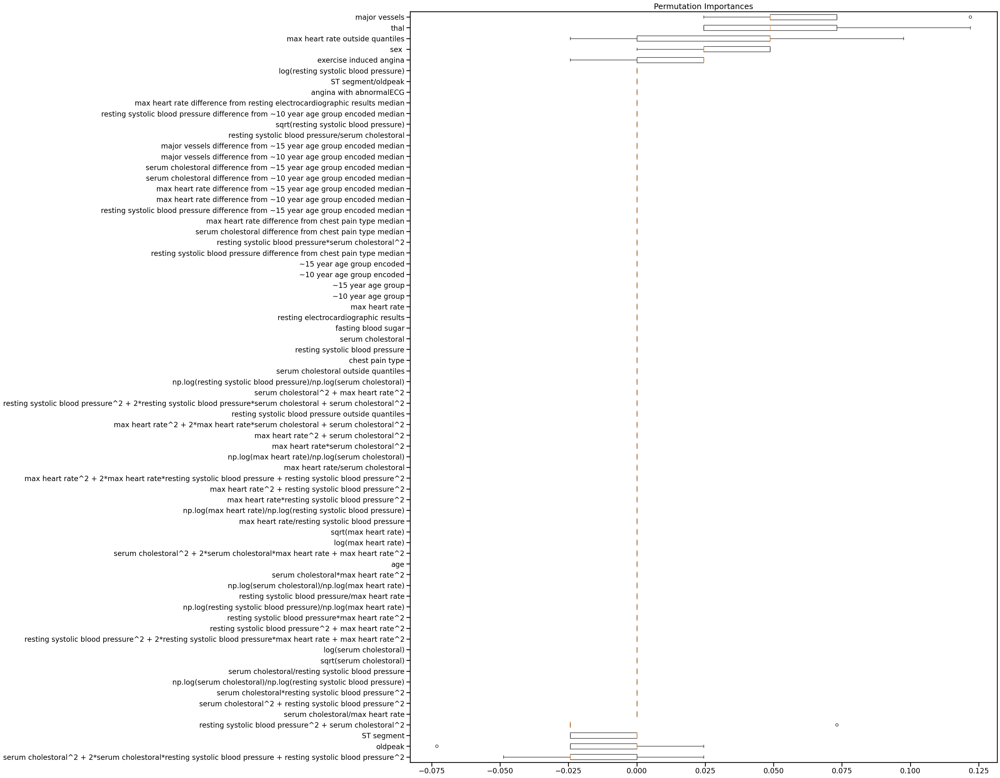

In [354]:
feature_importances = permutation_importance(estimator=lasso_CV.best_estimator_,
                                             X = X_test,
                                             y = y_test,
                                             n_repeats=5,
                                             random_state=123, 
                                             n_jobs=2)
print(feature_importances.importances.shape)
feature_importances.importances

visualize_feature_importance(feature_importances)

##### Ridge

(70, 5)


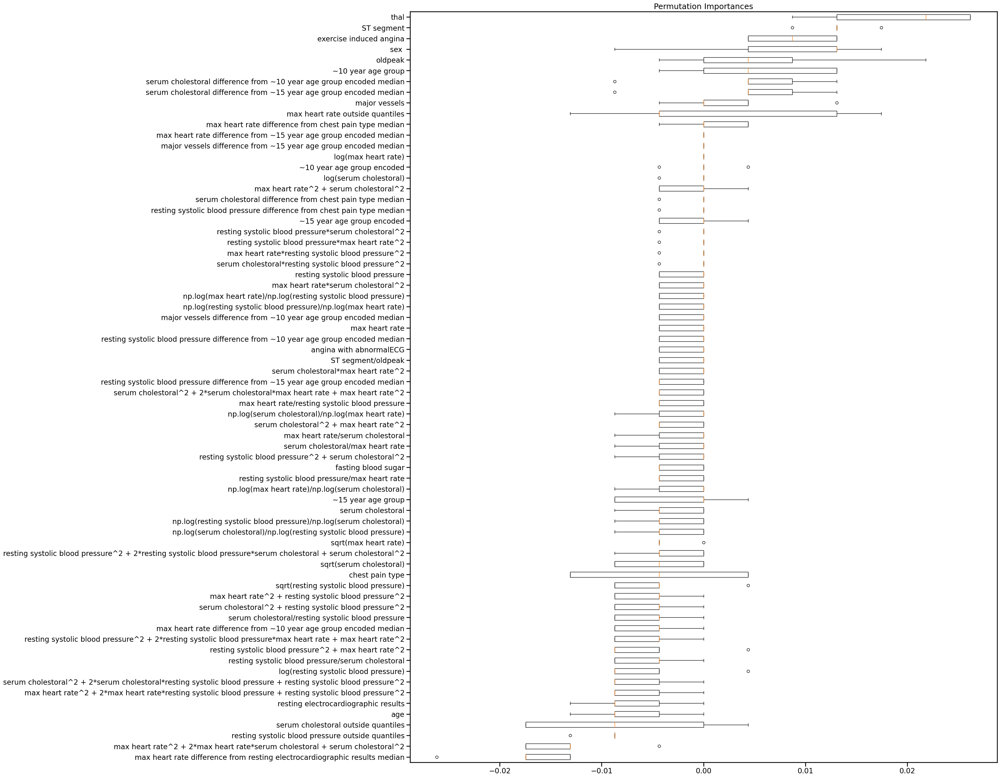

In [355]:
# ridge
feature_importances = permutation_importance(estimator=ridge_CV.best_estimator_,
                                             X = X_train,
                                             y = y_train,
                                             n_repeats=5,
                                             random_state=123, 
                                             n_jobs=2)
print(feature_importances.importances.shape)
feature_importances.importances

visualize_feature_importance(feature_importances)

(70, 5)


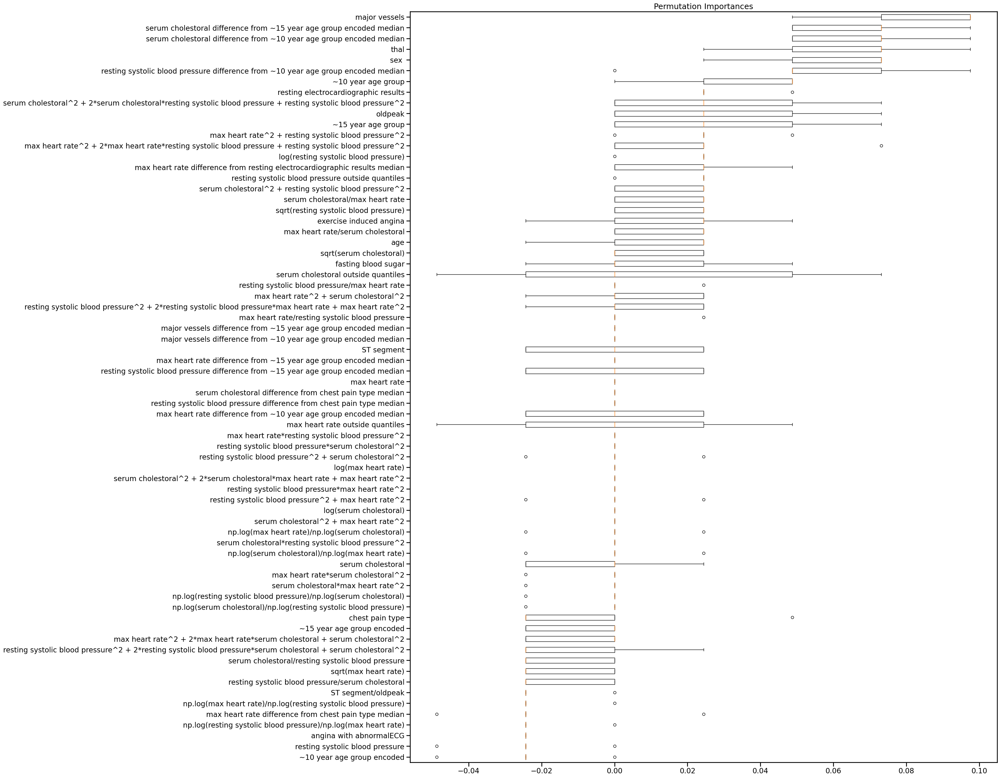

In [356]:
feature_importances = permutation_importance(estimator=ridge_CV.best_estimator_,
                                             X = X_test,
                                             y = y_test,
                                             n_repeats=5,
                                             random_state=123, 
                                             n_jobs=2)
print(feature_importances.importances.shape)
feature_importances.importances

visualize_feature_importance(feature_importances)

#### Manual Feature Selection
If we end up not using PCA, we will use a combination of the Ridge and LASSO features. Ridge being set at a threshold above 0.15 for coefficients to retain more significant features only (we do not but here is some code)

In [156]:
lasso_coefs = pd.Series(best_lasso.coef_[0], index=num_cols) 
lasso_selected_features = lasso_coefs[lasso_coefs != 0].sort_values(ascending=False)

# Ridge coefficients
ridge_coefs = pd.Series(best_ridge.coef_[0], index=num_cols)
ridge_selected_features = ridge_coefs[abs(ridge_coefs) > 0.15].sort_values(ascending=False)

# Combine distinct features
distinct_features = sorted(list(set(lasso_selected_features.index).union(set(ridge_selected_features.index))))
print(distinct_features)
print(f"Number of dimensions {len(distinct_features)}")# we end up removing two age group related columns which are redundant later, so this is **14**

['CP group likelihood to exper. ex angina', 'Likely to experience angina', 'ST segment', 'ST segment/oldpeak', 'exercise induced angina', 'major vessels', 'major vessels difference from ~10 year age group encoded median', 'major vessels difference from ~15 year age group encoded median', 'np.log(serum cholestoral)/np.log(max heart rate)', 'oldpeak', 'resting systolic blood pressure/max heart rate', 'serum cholestoral outside quantiles', 'sex ', 'thal', '~10 year age group encoded', '~15 year age group encoded']
Number of dimensions 16


### Classifiers

#### Reducing Dimensions on the Dataset: Should we perform PCA?
Since this is only 270 rows, it is best if we can remove some dimensions to better enable our predictors to generalize well while maintaining as much information as possible.

In [359]:
from sklearn.decomposition import PCA

num_cols = heart_df.select_dtypes(include=['number']).columns
num_cols = [col for col in num_cols if col != 'heart_disease']
transform = StandardScaler()
scaled_df = transform.fit_transform(heart_df[num_cols])

pca_list = []
feature_weight_list = []

# looks at different ranges of feature reduction
for n in range(5, 20):
    pca = PCA(n_components=n)
    pca.fit(scaled_df)
    # append for visualition of explained variance retained versus num of dimensions
    pca_list.append(pd.Series({'n':n, 'model':pca,
                               'var': pca.explained_variance_ratio_.sum()}))
    # append for visualization of Feature importance in dimension reductions
    abs_feature_values = np.abs(pca.components_).sum(axis=0)
    feature_weight_list.append(pd.DataFrame({'n':n, 
                                             'features': heart_df[num_cols].columns,
                                             'values':abs_feature_values/abs_feature_values.sum()}))
    
pca_df = pd.concat(pca_list, axis=1).T.set_index('n')
features_df = (pd.concat(feature_weight_list)
               .pivot(index='n', columns='features', values='values'))

Plot Explained Variance:
- NOTE: I considered 1-20 at first, but for visualization of Feature Importance vs. Dimensions to be clear, I reduced this to between 10-20

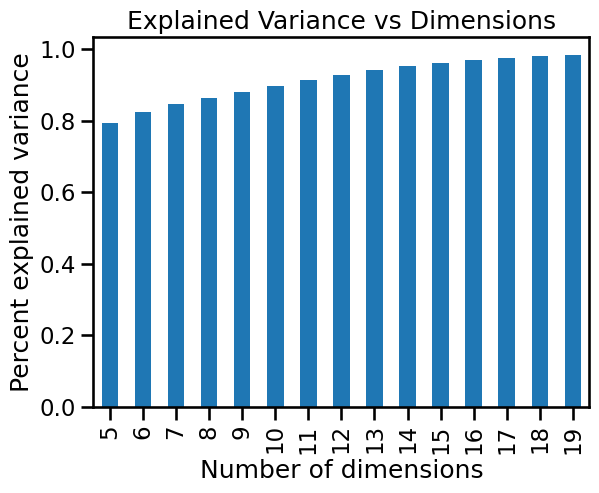

In [360]:
sns.set_context('talk')
ax = pca_df['var'].plot(kind='bar')

ax.set(xlabel='Number of dimensions',
       ylabel='Percent explained variance',
       title='Explained Variance vs Dimensions');

Feature Importance vs Dimensions Plot

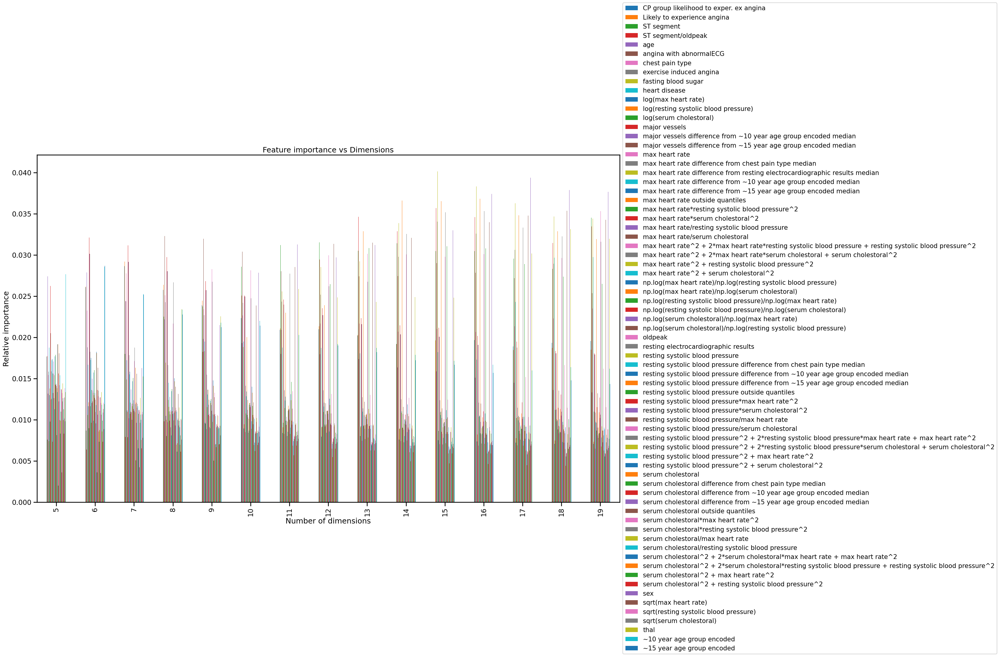

In [361]:
ax = features_df.plot(kind='bar', figsize=(25,15))
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='small')
ax.set(xlabel='Number of dimensions',
       ylabel='Relative importance',
       title='Feature importance vs Dimensions');

##### Unfortunately, this is one of those times where the visualization is going to be harder to interpret than tabular data:

Below is the full list to further analyze column importance for maintaining 70 dimensions' information in 14 dimensions

In [362]:
with pd.option_context('display.max_rows', None):
    print(features_df.loc[14].sort_values(ascending=False))
    

features
max heart rate outside quantiles                                                                                 0.036603
fasting blood sugar                                                                                              0.033872
sex                                                                                                              0.033411
ST segment/oldpeak                                                                                               0.032866
resting electrocardiographic results                                                                             0.032542
serum cholestoral outside quantiles                                                                              0.032079
ST segment                                                                                                       0.031434
resting systolic blood pressure outside quantiles                                                                0.030334
oldpeak        

We will be reducing down to 14 dimensions:
- To maintain the information from 73 dimensions down to 14:
    - **Most Important Features**: `max heart rate` outside of all patients observed max heart rate's IQR, fasting blood sugar result, the sex of the patient, and the ratio of `ST Segment/oldpeak` were the most important features in maintaining variance in 14 dimensions
    - **Least Important Features**: `serum cholestoral` raw value and 2nd degree polynomial interaction of `serum cholestoral` & `resting systolic blood pressure` being the bottom two features for maintaining variance

`serum cholestoral` being the lowest value here surprises me, but at the same time there is a decent amount of multi-collinearity in this dataset due to the derived features so this makes sense considering `serum cholestoral outside quantiles` is in the top 6 most significant for retaining variance. While I say that, both `ST segment/oldpeak`, `oldpeak`, `ST segment` all reside in the highest features for retaining variance, so the results are definitely interesting.

##### Applying PCA to the dataset

In [363]:
pca = PCA(n_components=14)
pca_result = pca.fit_transform(scaled_df)

pca_df = pd.DataFrame(data=pca_result, columns=[f"PC{n+1}" for n in range(pca_result.shape[1])])

##### Clustering
I had previously attempted to use MeanShift and DBSCAN, but both were performing with a bit *wonky*, so logically I thought about KMeans clustering. 

Initially I tried this with 2 clusters, but as you will see [below](#Clustering-Result), 3 is a bit better. 3 also would make sense in terms of scaling risk: not every one is either low or high risk, so a mild cluster would logically make sense.

In [364]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=3,random_state=0)
km.fit(pca_df)
labels = km.labels_
heart_df["PC KMeans Clustering"] = labels
pca_df["KMeans Cluster"] = labels

So now, let's perform PCA again, but this time just to create 4 dimensions. *Why at all & why just 4*?: Plot the 4 principal components with heart disease and the PCA cluster results to better establish how the data we used

In [365]:
import plotly
import plotly.graph_objs as go
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

pca = PCA(n_components=4)
plot_df = pca.fit_transform(scaled_df)

plot_df = pd.DataFrame(data=plot_df, columns=[f"PC{n+1}" for n in range(plot_df.shape[1])])

markersize = abs(plot_df['PC4'])*5
color_map = {0:"red",1:"blue",2:"orange"} # ,-1:"white"
markercolor = pca_df['KMeans Cluster'].map(color_map)
# heart_df["heart disease"] = np.where(heart_df["heart disease"] == 2,1,0)
shape_map = {0:"x",1:"circle"}
markershape = heart_df['heart disease'].map(shape_map)

fig1 = go.Scatter3d(x=plot_df['PC1'],
                    y=plot_df['PC2'],
                    z=plot_df['PC3'],
                    marker={
                        'size': markersize,
                        'color': markercolor,
                        'symbol': markershape,
                        'opacity': 0.75,
                        'reversescale': True,
                        'colorscale': 'Blues',
                    },
                    line={"width":0.02},
                    mode='markers')

mylayout = go.Layout(scene={"xaxis":{"title":"Principal Component 1"},
                            "yaxis":{"title":"Principal Component 2"},
                            "zaxis":{"title":"Principal Component 3"}},
                    )

plotly.offline.plot({"data": [fig1],
                     "layout": mylayout},
                     auto_open=True,
                     filename=(r"6D-Heart-Disease-Plot-PCAwClusters.html"))

print("Completed")

Completed


#### Clustering Result
    
    Pricipal Components 1-3: X,Y,Z
    Markersize: absolute value of Principal Component 4 multiple by 5
    Markercolor: KMeansCluster Group
    Markershape: X- No heart disease; Circle- Heart disease

##### Initial Look
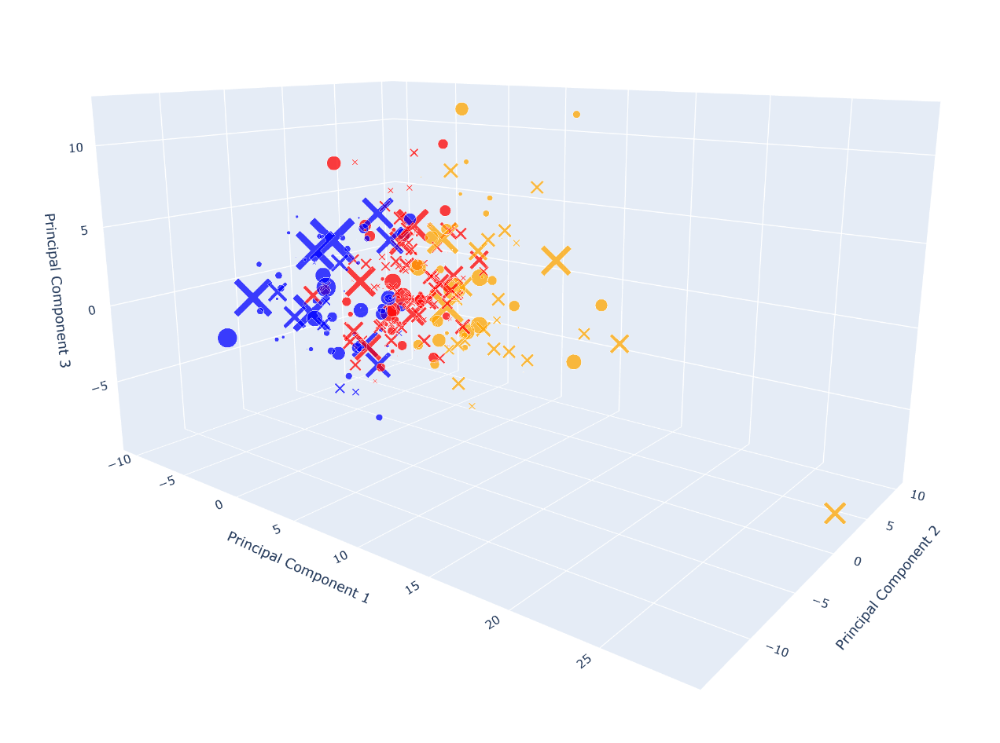

##### **Sometimes you need to shift your perspective to see what is going on...**

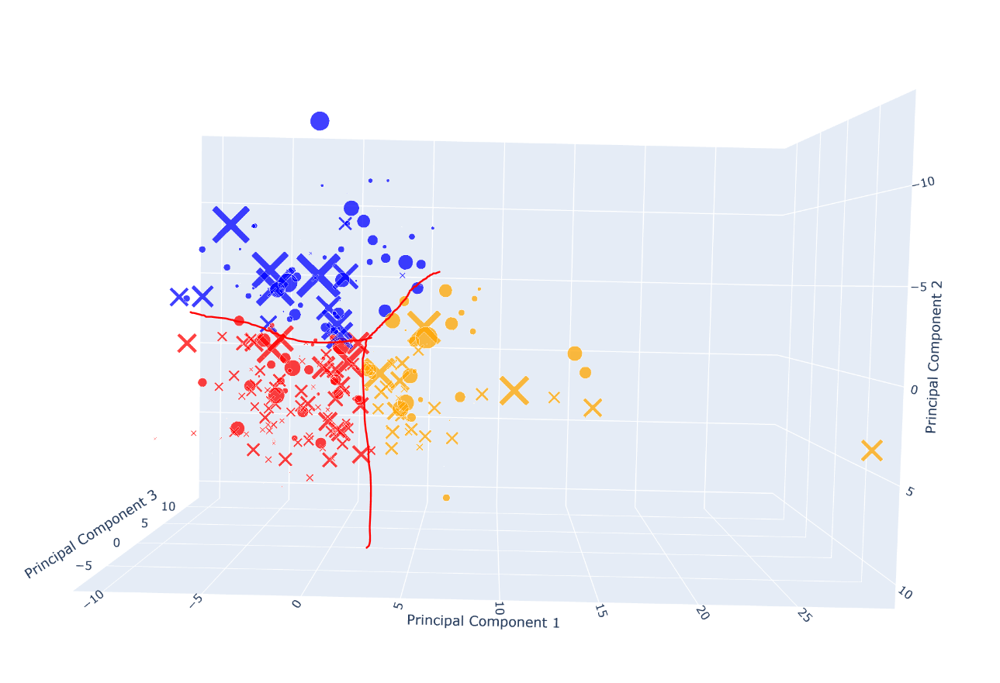

Seems to be a relative boundary between the clusters, but recall this only 3 dimensions of spacing and 1 dimension for size for clustering which occured on 14 dimensions of data

Looking at the clusters, the blue seem to favor heart disease a bit more than no heart disease, but the red cluster group members can breathe easily: red appears to be dominated with `X` which indicates no heart disease found. The orange seems to be a bit more vague with a more even distribution of values. Not a bad start for clusters which represent: `Low Risk`, `Mild Risk`, and `High Risk`.

#### Train-Test-Split & Scaling for Classifiers

In [417]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

X = pca_df
Y = heart_df["heart disease"]

# transform = StandardScaler()
# X = transform.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.15,random_state=42)

#### Logistic Regression

In [367]:
LR = LogisticRegression()
LR.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [368]:
param_grid = {
    "C":[0.1,1,10,20,50],
    "penalty":['l1','l2'],
    "solver":['liblinear'],
}

LR_CV = GridSearchCV(LR,param_grid,scoring='f1',cv=10)
LR_CV.fit(X_train, y_train)

LR_pred = LR_CV.predict(X_test)
print(f"Best Parameters: {LR_CV.best_params_}")

Best Parameters: {'C': 50, 'penalty': 'l2', 'solver': 'liblinear'}


In [420]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

cr = classification_report(y_test, LR_pred)
print(cr)

score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, LR_pred),
                         'precision': precision_score(y_test, LR_pred),
                         'recall': recall_score(y_test, LR_pred),
                         'f1': f1_score(y_test, LR_pred),
                         'auc': roc_auc_score(y_test, LR_pred)},
                         index=pd.Index([0]))

print(score_df)

              precision    recall  f1-score   support

           0       0.96      0.96      0.96        23
           1       0.94      0.94      0.94        18

    accuracy                           0.95        41
   macro avg       0.95      0.95      0.95        41
weighted avg       0.95      0.95      0.95        41

   accuracy  precision    recall        f1       auc
0   0.95122   0.944444  0.944444  0.944444  0.950483


***Boo-yeah***

In [389]:
from sklearn.metrics import precision_recall_fscore_support
def evaluate(yt, yp, eval_type="Original"):
    results_pos = {}
    results_pos['type'] = eval_type
    # Accuracy
    results_pos['accuracy'] = accuracy_score(yt, yp)
    # Precision, recall, Fscore
    precision, recall, _, _ = precision_recall_fscore_support(yt, yp, beta=5, pos_label=1, average='binary')
    results_pos['recall'] = recall
    # AUC
    results_pos['auc'] = roc_auc_score(yt, yp)
    # Precision
    results_pos['precision'] = precision
    # Fscore
    results_pos['fscore'] = f1_score(yt, yp)
    return results_pos
results = []
result = evaluate(y_test,LR_pred,"Logistic Regression")
results.append(result)

#### Support Vector Machines

In [371]:
from sklearn.svm import SVC

SVM = SVC()
SVM.get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

In [374]:
param_grid = {
    "C":[0.01,0.1,0.5,1],
    "kernel":["rbf"],
    "gamma":[0.01,0.1,0.5,1,5]
}

SVM_CV = GridSearchCV(SVM, param_grid, scoring='recall', cv=10)
SVM_CV.fit(X_train,y_train)

SVM_pred = SVM_CV.predict(X_test)
print(f"Best Parameters: {SVM_CV.best_params_}")

Best Parameters: {'C': 0.5, 'gamma': 0.01, 'kernel': 'rbf'}


In [375]:
cr = classification_report(y_test, SVM_pred)
print(cr)

score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, SVM_pred),
                         'precision': precision_score(y_test, SVM_pred),
                         'recall': recall_score(y_test, SVM_pred),
                         'f1': f1_score(y_test, SVM_pred),
                         'auc': roc_auc_score(y_test, SVM_pred)},
                         index=pd.Index([0]))

print(score_df)

              precision    recall  f1-score   support

           0       0.85      0.96      0.90        23
           1       0.93      0.78      0.85        18

    accuracy                           0.88        41
   macro avg       0.89      0.87      0.87        41
weighted avg       0.88      0.88      0.88        41

   accuracy  precision    recall        f1      auc
0  0.878049   0.933333  0.777778  0.848485  0.86715


In [390]:
result = evaluate(y_test,SVM_pred,"SVM")
results.append(result)

#### Tree Models
##### Random Forest

In [376]:
from sklearn.ensemble import RandomForestClassifier

RF = RandomForestClassifier()
RF.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [377]:
param_grid = {
    'criterion': ['gini','entropy','log_loss'],
    'n_estimators': [10,25,50,100,150,200,250,300],
    'max_depth' : [2,3,4,5],
    'max_features':["sqrt", "log2"]
}

RF_CV = GridSearchCV(RF, param_grid,scoring='f1',cv=10)
RF_CV.fit(X_train, y_train)

RF_pred = RF_CV.predict(X_test)
print(f"Best Parameters: {RF_CV.best_params_}")

Best Parameters: {'criterion': 'gini', 'max_depth': 4, 'max_features': 'log2', 'n_estimators': 250}


In [378]:
cr = classification_report(y_test, RF_pred)
print(cr)

score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, RF_pred),
                         'precision': precision_score(y_test, RF_pred),
                         'recall': recall_score(y_test, RF_pred),
                         'f1': f1_score(y_test, RF_pred),
                         'auc': roc_auc_score(y_test, RF_pred)},
                         index=pd.Index([0]))

print(score_df)

              precision    recall  f1-score   support

           0       0.91      0.91      0.91        23
           1       0.89      0.89      0.89        18

    accuracy                           0.90        41
   macro avg       0.90      0.90      0.90        41
weighted avg       0.90      0.90      0.90        41

   accuracy  precision    recall        f1       auc
0  0.902439   0.888889  0.888889  0.888889  0.900966


In [391]:
result = evaluate(y_test,RF_pred,"Random Forest")
results.append(result)

##### Gradient Boosted Classifier

In [380]:
from xgboost import XGBClassifier

XGB = XGBClassifier(booster="gbtree")
XGB.get_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': 'gbtree',
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [381]:
param_grid = {
    "n_estimators":[5,10,25,50,100,150,200,300],
    "learning_rate":[0.05,0.1,0.25,0.5,0.75,1],
    "max_depth":[2,3,4,5,7],
    "subsample":[0.6,0.8,1],
    "eval_metric":['mglogloss','logloss','auc','error']
}

XGB_CV = GridSearchCV(XGB,param_grid,scoring='recall',cv=10)
XGB_CV.fit(X_train,y_train)

XGB_pred = XGB_CV.predict(X_test)
print(f"Best Parameters: {XGB_CV.best_params_}")

Best Parameters: {'eval_metric': 'logloss', 'learning_rate': 0.75, 'max_depth': 2, 'n_estimators': 10, 'subsample': 0.8}


In [382]:
cr = classification_report(y_test, XGB_pred)
print(cr)

score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, XGB_pred),
                         'precision': precision_score(y_test, XGB_pred),
                         'recall': recall_score(y_test, XGB_pred),
                         'f1': f1_score(y_test, XGB_pred),
                         'auc': roc_auc_score(y_test, XGB_pred)},
                         index=pd.Index([0]))

print(score_df)

              precision    recall  f1-score   support

           0       0.88      0.96      0.92        23
           1       0.94      0.83      0.88        18

    accuracy                           0.90        41
   macro avg       0.91      0.89      0.90        41
weighted avg       0.91      0.90      0.90        41

   accuracy  precision    recall        f1       auc
0  0.902439     0.9375  0.833333  0.882353  0.894928


In [392]:
result = evaluate(y_test,XGB_pred,"Gradient Boosting")
results.append(result)

#### KNN
Let's see if there is an proximity related insights

In [384]:
from sklearn.neighbors import KNeighborsClassifier

KNN = KNeighborsClassifier()
KNN.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [385]:
param_grid = {
    "algorithm":['auto'],
    "n_neighbors":[5,8,10,12,15]
}

KNN_CV = GridSearchCV(KNN,param_grid,scoring='f1',cv=10)
KNN_CV.fit(X_train,y_train)

KNN_pred = KNN_CV.predict(X_test)
print(f"Best Parameters: {KNN_CV.best_params_}")

Best Parameters: {'algorithm': 'auto', 'n_neighbors': 5}


In [386]:
cr = classification_report(y_test, KNN_pred)
print(cr)

score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, KNN_pred),
                         'precision': precision_score(y_test, KNN_pred),
                         'recall': recall_score(y_test, KNN_pred),
                         'f1': f1_score(y_test, KNN_pred),
                         'auc': roc_auc_score(y_test, KNN_pred)},
                         index=pd.Index([0]))

print(score_df)

              precision    recall  f1-score   support

           0       0.84      0.91      0.88        23
           1       0.88      0.78      0.82        18

    accuracy                           0.85        41
   macro avg       0.86      0.85      0.85        41
weighted avg       0.86      0.85      0.85        41

   accuracy  precision    recall        f1       auc
0  0.853659      0.875  0.777778  0.823529  0.845411


In [393]:
result = evaluate(y_test,KNN_pred,"K-Nearest Neighbor")
results.append(result)

### Evaluating Models

                  type  accuracy    recall       auc  precision    fscore
0  Logistic Regression  0.951220  0.944444  0.950483   0.944444  0.944444
1                  SVM  0.878049  0.777778  0.867150   0.933333  0.848485
2        Random Forest  0.902439  0.888889  0.900966   0.888889  0.888889
3    Gradient Boosting  0.902439  0.833333  0.894928   0.937500  0.882353
4   K-Nearest Neighbor  0.853659  0.777778  0.845411   0.875000  0.823529


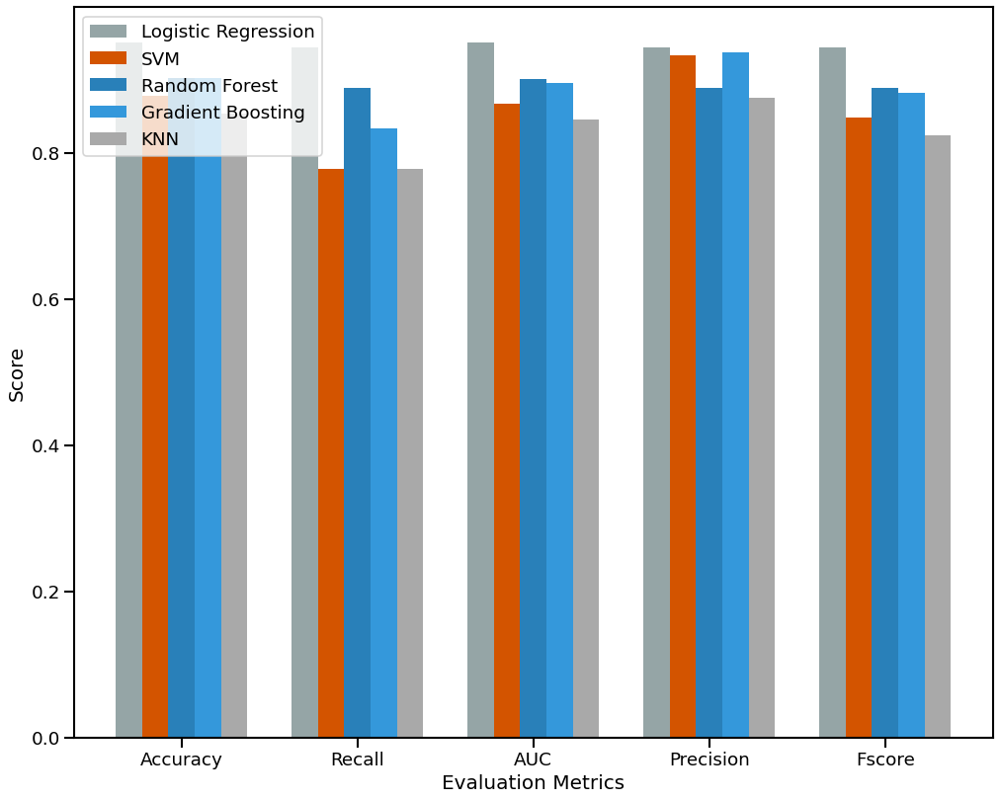

In [394]:
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt

def visualize_eval_metrics(results):
    df = pd.DataFrame(data=results)
    #table = pd.pivot_table(df, values='type', index=['accuracy', 'precision', 'recall', 'f1', 'auc'],
    #                columns=['type'])
    #df = df.set_index('type').transpose()
    print(df)
    x = np.arange(5)
    lr = df.iloc[0, 1:].values
    svm = df.iloc[1, 1:].values
    rf = df.iloc[2, 1:].values
    xgb = df.iloc[3, 1:].values
    knn = df.iloc[4, 1:].values
    width = 0.15
    figure(figsize=(15, 12), dpi=80)
    plt.bar(x-2*width, lr, width, color='#95a5a6')
    plt.bar(x-width, svm, width, color='#d35400')
    plt.bar(x, rf, width, color='#2980b9')
    plt.bar(x+width, xgb, width, color='#3498db')
    plt.bar(x+2*width, knn, width, color='#A9A9A9')
    plt.xticks(x, ['Accuracy', 'Recall', 'AUC', 'Precision', 'Fscore'])
    plt.xlabel("Evaluation Metrics")
    plt.ylabel("Score")
    plt.legend(["Logistic Regression", "SVM", "Random Forest", "Gradient Boosting","KNN"])
    plt.show()

visualize_eval_metrics(results)

### Stacking
So upon evaluation, it is easy to see KNN is not worth including. But this then requires a decision on the other classifiers. Upon rerunning the algorithm a few times, XGB is providing the best accuracy

Stacked Classifier: `Logistic Regression` , `Kernel SVM` , `XGB`

In [418]:
from sklearn.ensemble import VotingClassifier

LR_params = {'C': 50, 'penalty': 'l2', 'solver': 'liblinear'}
SVM_params = {'C': 0.5, 'gamma': 0.01, 'kernel': 'rbf'}
# RF_params = {'criterion': 'gini', 'max_depth': 4, 'max_features': 'log2', 'n_estimators': 250}
XGB_params = {'eval_metric': 'logloss', 'learning_rate': 0.5, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.6}
# KNN_params = {'algorithm': 'auto', 'n_neighbors': 5}

estimators = [("LR",LogisticRegression(**LR_params,random_state=42)),
              ("SVM_k",SVC(**SVM_params,random_state=42)),
              ("XGB",XGBClassifier(**XGB_params,random_state=42)),
             ]

VC = VotingClassifier(estimators,voting="hard")
VC.fit(X_train,y_train)

VC_pred = VC.predict(X_test)

In [419]:
cr = classification_report(y_test, VC_pred)
print(cr)

score_df = pd.DataFrame({'accuracy': accuracy_score(y_test, VC_pred),
                         'precision': precision_score(y_test, VC_pred),
                         'recall': recall_score(y_test, VC_pred),
                         'f1': f1_score(y_test, VC_pred),
                         'auc': roc_auc_score(y_test, VC_pred)},
                         index=pd.Index([0]))

print(score_df)

              precision    recall  f1-score   support

           0       0.92      0.96      0.94        23
           1       0.94      0.89      0.91        18

    accuracy                           0.93        41
   macro avg       0.93      0.92      0.93        41
weighted avg       0.93      0.93      0.93        41

   accuracy  precision    recall        f1       auc
0  0.926829   0.941176  0.888889  0.914286  0.922705


These metrics are lower than the Logistic Regressor model alone, but the non-linear patterns SVM and XGB may be able to pick up with new data might be valuable considering this is only a sample. We will evaluate the logistic regression model's intepretation however.

## Interperting the Reduced Dimension Model
Instead of using the actual heart disease binary values as targets, we will use the projected ones to better understand the factors in these predictions:

In [422]:
X = pca_df
params = {'C': 50, 'penalty': 'l2', 'solver': 'liblinear'}
LR = LogisticRegression(**params, random_state=42)
LR.fit(X_train,y_train)

LR_results = LR.predict(X)

#### Correlation Matrix

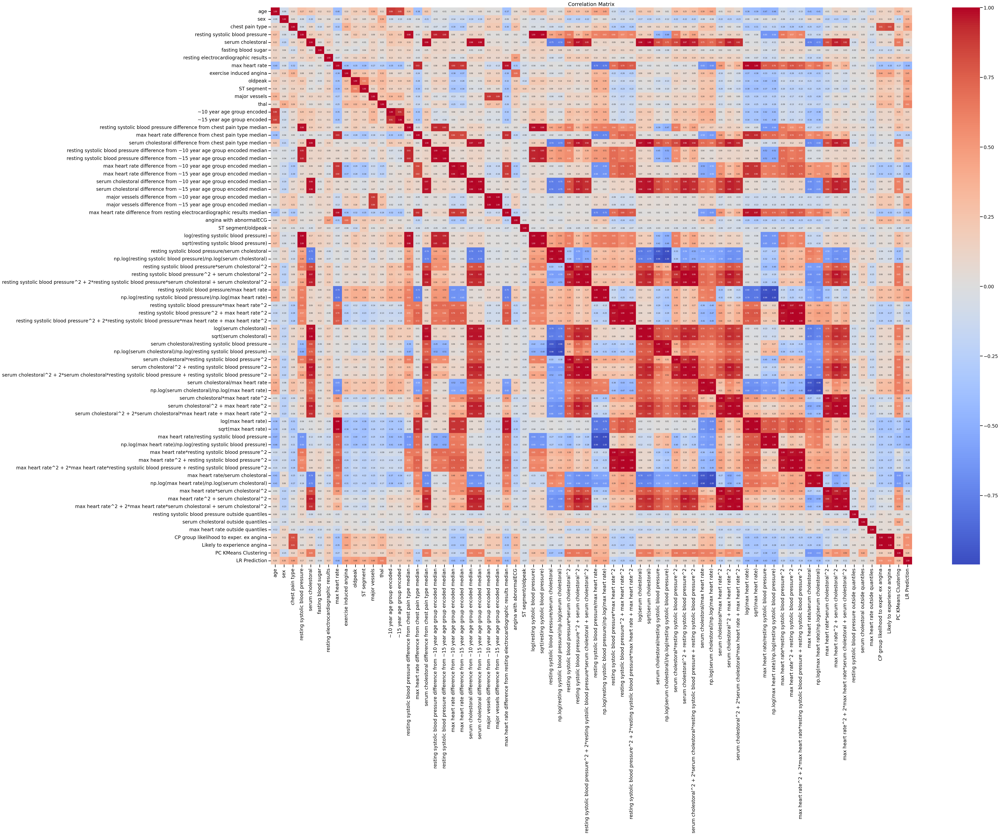

In [430]:
cols = [col for col in heart_df.columns if col != 'heart disease']
corr_df = heart_df[cols]
corr_df["LR Prediction"] = LR_results
num_cols = corr_df.select_dtypes(include=["number"]).columns
correlation_matrix = corr_df[num_cols].corr()
plt.figure(figsize=(50, 35))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 6})
plt.title('Correlation Matrix')
plt.show()

#### Evaluating the original dataset with the Stacked Classifier results using LASSO and Ridge to help understand the reduced dimension model

In [424]:
num_cols = [col for col in heart_df.select_dtypes(include=['number']).columns if col != 'heart disease']

X = heart_df[num_cols]
Y = LR_results

transform = StandardScaler()
X = transform.fit_transform(X)

lasso = LogisticRegression(random_state=42)
param_grid = {
    "C":[0.1,1,10,20],
    "penalty":['l1'],
    "solver":['liblinear']
}

lasso_CV = GridSearchCV(lasso,param_grid, cv=10)
lasso_CV.fit(X,VC_results)

best_lasso = lasso_CV.best_estimator_
coefs = pd.Series(best_lasso.coef_[0], index=num_cols)
lasso_features = coefs[coefs != 0].sort_values(ascending=False)
# do not want to alls use max rows, but we need it here
with pd.option_context('display.max_rows', None):
    print(lasso_features)

PC KMeans Clustering                                                                 1.448251
major vessels                                                                        1.396819
thal                                                                                 1.357144
sex                                                                                  1.261748
Likely to experience angina                                                          1.177838
oldpeak                                                                              0.863861
ST segment                                                                           0.850270
resting systolic blood pressure/max heart rate                                       0.749002
resting electrocardiographic results                                                 0.658083
age                                                                                  0.578688
exercise induced angina                                     

Next, let's look at Ridge to check for multicollinearity

In [426]:
ridge = LogisticRegression(random_state=42)
param_grid = {
    "C":[0.1,1,10,20],
    "penalty":['l2'],
    "solver":['liblinear','lbfgs']
}

ridge_CV = GridSearchCV(ridge,param_grid, cv=10)
ridge_CV.fit(X,VC_results)

best_ridge = ridge_CV.best_estimator_
coefs = pd.Series(best_ridge.coef_[0], index=num_cols)
ridge_features = coefs[coefs != 0].sort_values(ascending=False)
# do not want to alls use max rows, but we need it here
with pd.option_context('display.max_rows', None):
    print(ridge_features)

thal                                                                                                             0.798776
sex                                                                                                              0.627017
oldpeak                                                                                                          0.513422
PC KMeans Clustering                                                                                             0.462772
ST segment                                                                                                       0.454689
major vessels                                                                                                    0.363544
Likely to experience angina                                                                                      0.337997
major vessels difference from ~10 year age group encoded median                                                  0.335190
major vessels difference

##### **Feature Permutations**
##### LASSO

(71, 5)


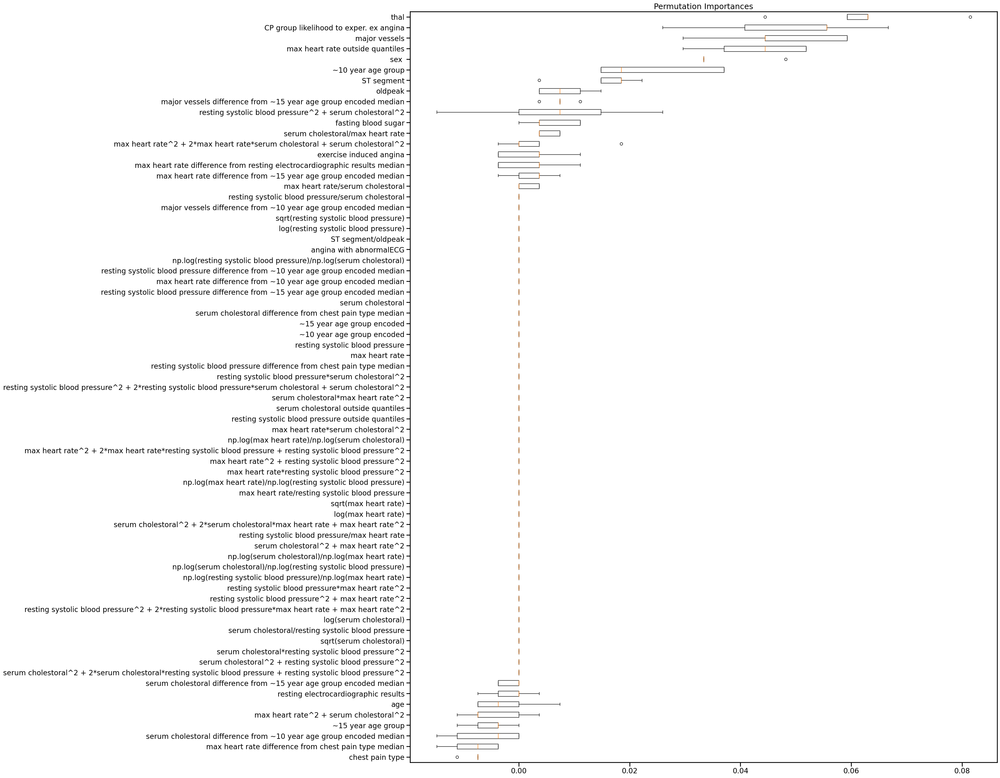

In [427]:
# lasso
feature_importances = permutation_importance(estimator=lasso_CV.best_estimator_,
                                             X = X,
                                             y = VC_results,
                                             n_repeats=5,
                                             random_state=123, 
                                             n_jobs=2)
print(feature_importances.importances.shape)
feature_importances.importances

visualize_feature_importance(feature_importances)

##### Ridge

(71, 5)


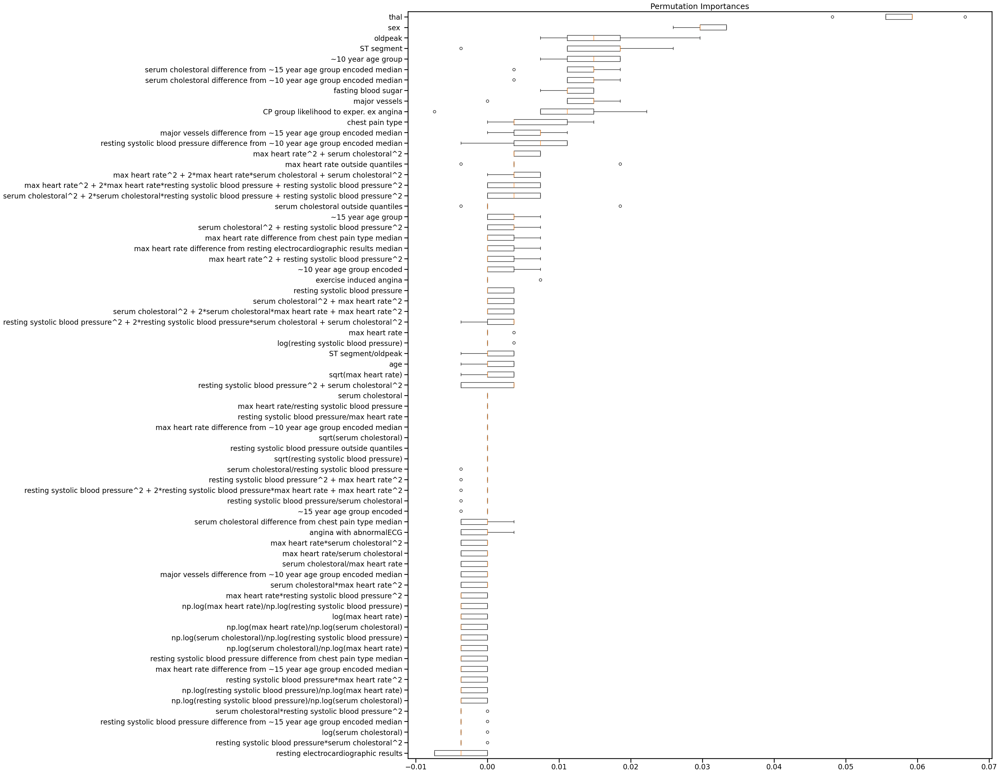

In [428]:
# ridge
feature_importances = permutation_importance(estimator=ridge_CV.best_estimator_,
                                             X = X,
                                             y = VC_results,
                                             n_repeats=5,
                                             random_state=123, 
                                             n_jobs=2)
print(feature_importances.importances.shape)
feature_importances.importances

visualize_feature_importance(feature_importances)

# Conclusions
#### Considerations
I think it is again important to establish that this is a 270 record sample, and has a good chance of being only representative of a portion of the population. Considering our hypothesis test could not gurantee that the mean was not 50/50 heart disease based on the data, despite having an actual ratio of 150/120, I think it is good to take these results with the proper perspective.

#### Model Evaluation Results
Using a LASSO and Ridge analysis to analyze the predictions based on the reduced dimensions of the original and engineered data, I was able to determine that `thal` which is the feature representing whether or not thalassemia is present and whether it was treated, was highly important in finding heart disease in patients. Within the correlation matrix, it shows a positive `0.62` correlational strength with determining the stacked predictions. However, thalassemia is an uncommon disease, affecting only about 300 million people in the world, according to [Boston's Children Hospital](https://www.childrenshospital.org/conditions/thalassemia#:~:text=More%20than%201%20million%20people,people%20have%20transfusion%2Ddependent%20thalassemia.). For more common situations, it would seem that the amount of cornoray artries visible in the colored fluroscopy results also correlate to heart disease. `major vessels` had a correlational strength of `0.46` & appear in both the non-zeroed LASSO coefficients & above the 80 percentile of important features in the Ridge analysis. `oldpeak` and `ST Segment` both appeared as one of the more important features in the analyses as well. 

A more useful metric that appeared important in both the Ridge and LASSO analyses is a serum cholestoral levels distance from their age groups median of the dataset sample. Albeit, serum cholestoral is known as a correlational factor with heart disease, so this is not exactly groundbreaking truth, but further confirmation. it is interesting that both the LASSO and Ridge's feature importance plots indicate that raw `serum cholestoral` did not have a huge impact in determining the results once PCA was applied to the dataset. `max heart rate` also came in with basically minimal impact as a raw value, but we did see features including did. It also had a `-0.48` correlation with the predictions in a direct correlation comparison in our heatmap, so this is an unexpected behavior. However, with PCA, the idea is to reduce the dimensions to capture as much variance as possible while reducing the feature space. This could mean that the `serum cholestoral` and `max heart rate` alone simply does not provide enough variance on their own compared to what the engineered features gave the model.

The clustering obviously had more effect due to it being considered *with the principal components* but it still shows a large influence on the outcomes.

Overall, I cannot say there was anything breaktakingly shocking in this analysis, but very excited to see the projections come in strong. As stated in my considerations, this is a small amount of data but the model still is performing very well in on all accuracy metrics. If anyone reading this is a subject matter expert, I would love to hear your opinions, comments, and refinements of this project! Most of the research done on this was on my own and the few peers I consulted who worked in the medical field were both students and a retired nurse, whose base knowledge were much better than my own but also do not consider themselves '*subject matter experts*'